In [1]:
using JuMP, CPLEX
model = Model(CPLEX.Optimizer)
set_attribute(model, "CPX_PARAM_EPINT", 1e-8)
using Printf
using Plots
using ColorTypes

# Function to calculate Euclidean distance
function calculate_distance(x1, y1, x2, y2)
    return sqrt((x1 - x2)^2 + (y1 - y2)^2)
end

# Function to calculate distance matrix
function calculate_distance_matrix(x,y,nc)
    distances = zeros(length(x),length(x))
    for i in 1:length(x)
        for j in 1:length(y)
            if(i==j)
                distances[i,j] = 10000.00
            elseif((i==1 || j==1)&&(length(x)-i<nc || length(y)-j<nc))
                distances[i, j] = 10000.00
            else
                distances[i, j] = (calculate_distance(x[i], y[i], x[j], y[j]))
            end
        end
    end
    
    # Printing the matrix with formatting
    for i in 1:length(x)
        for j in 1:length(x)
            @printf "%-5.2f  " distances[i, j]
        end
        println()
    end
    
    return distances

end

function generate_rgb_colors(l::Int)
    colors = [RGB(rand(), rand(), rand()) for _ in 1:l]
    return colors
end

generate_rgb_colors (generic function with 1 method)

In [2]:
# Define a structure for the customer data
struct Customer
    cust_no::Int
    xcoord::Int
    ycoord::Int
    demand::Int
    ready_time::Int
    due_date::Int
    service_time::Int
end

function readFile()
    # Specify the file path
    file_path = "../TestV1/100/C101.txt"

    # Read the file lines
    lines = open(file_path, "r") do file
        readlines(file)
    end

    # Find the index where the customer data starts
    start_index = findfirst(contains.(lines, "CUST NO.")) + 1

    x_coor_customers = []
    x_coor_depot = []
    y_coor_customers = []
    y_coor_depot = []
    demands = []
    time_windows = []
    zeta = 0

    # Parse the customer data
    customers = []
    for i in start_index+1:length(lines)
        line = strip(lines[i])
        if !isempty(line)
            fields = split(line)
            # Depot
            if i == start_index + 1
                push!(x_coor_depot, parse(Int, fields[2]))
                push!(y_coor_depot, parse(Int, fields[3]))
                zeta = parse(Int, fields[6])
            else
                # Customers
                customer = Customer(
                    parse(Int, fields[1]),
                    parse(Int, fields[2]),
                    parse(Int, fields[3]),
                    parse(Int, fields[4]),
                    parse(Int, fields[5]),
                    parse(Int, fields[6]),
                    parse(Int, fields[7])
                )
                push!(customers, customer)
            end
        end
    end
    
    # Fill in the attributes
    for customer in customers
        push!(x_coor_customers, customer.xcoord)
        push!(y_coor_customers, customer.ycoord)
        push!(demands, customer.demand)
        push!(time_windows, (customer.ready_time, customer.due_date))
    end
    
    return x_coor_customers, y_coor_customers, x_coor_depot, y_coor_depot, demands, time_windows, zeta
    
end

readFile (generic function with 1 method)

In [3]:
function displayMap()
    node_labels = [string("N.", i) for i in N]
    # demand_labels = [string("D= ", demands[i-1-np]," TW= ",time_windows[i-1-np]) for i in C]
    demand_labels = [string("D= ", demands[i-1-np]) for i in C]
   
    default(size=(800, 600))
    gr()
    
    # Create a customers scatter plot
    scatter(x_coor_customers, y_coor_customers,
                   title = "Coordinate Plot",
                   xlabel = "X-axis",
                   ylabel = "Y-axis",
                   legend = false, markersize = 6, markercolor = :pink, 
                   marker=:utriangle, markerstrokecolor = :transparent, 
                   markerstrokewidth=0, label = "Customers")

    # Create a parking scatter plot
    scatter!(x_coor[2:1+np], y_coor[2:1+np], 
            title = "Coordinate Plot",
            xlabel = "X-axis", ylabel = "Y-axis",
            legend = false)
 
    # Add the depot point in a different color
    scatter!([x_coor[1]], [y_coor[1]], 
             markersize = 8, markercolor = :yellow)
   
    # Add the initial parking place in a different color
    for p in P
        if PI[p-1]==1
            scatter!([x_coor[p]], [y_coor[p]], 
                 markersize = 8, markercolor = :lightblue)
        else
            scatter!([x_coor[p]], [y_coor[p]], 
             markersize = 6, markercolor = :white)
        end
    end

    # Add demand annotations for each node
    for i in 1:length(x_coor)
        annotate!(x_coor[i], y_coor[i]+0.3, text(node_labels[i], :center, 4))
        if i<= nc
            # annotate!(x_coor[i+1+np], y_coor[i+1+np]-0.3, text(demand_labels[i], :center, 3)) 
        end
    end 
plot!()
end


displayMap (generic function with 1 method)

100


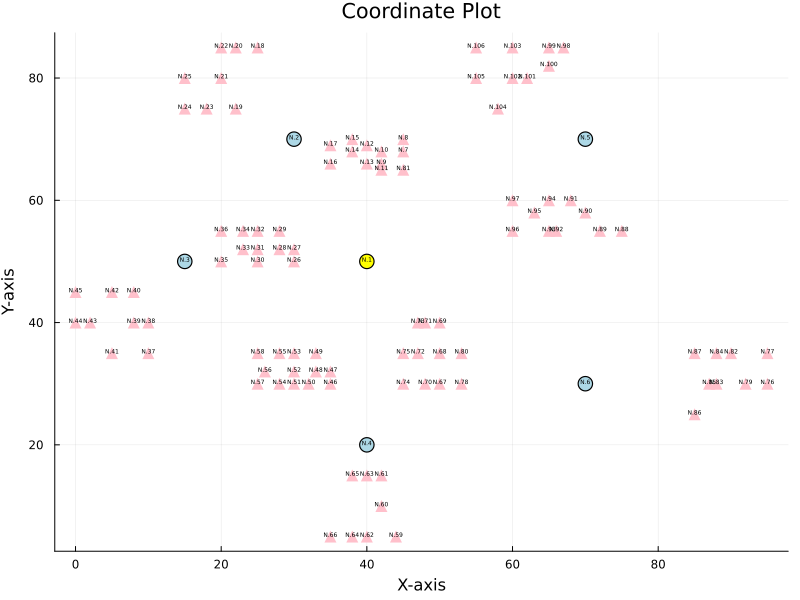

In [4]:
#===========SET==============================================================#
x_coor_customers, y_coor_customers, x_coor_depot, y_coor_depot, demands, time_windows, zeta = readFile()
# Number of customers
nc = length(x_coor_customers)
# Coordinate x (Parking node)
x_coor_parkings = [30,15,40,70,70]
# Coordinate y (Parking node)
y_coor_parkings = [70,50,20,70,30]

# Number of parking places
np = length(x_coor_parkings)
P = 2 : np+1 #Set of parking place
C = np+2 : np+nc+1 #Set of customers
A1 = 1 : 1+np #Set of FE arcs
A2 = 2 : 1+np+nc #Set of SE arcs
V1 = 1:1 #Set of FEV
V2 = 1:10 #Set of SEV
N = 1:np+nc+1 #Set of nodes

#===========PARAMETER========================================================#
Q0 = 10000 #Capacity of FEV
Q1 = 6000 #Capacity of MM
Q2 = 2000 #Capacity of SEV
M = 10000
PI = [1,1,1,1,1] #Initial parking indicator
eta1 = 2
eta2 = 1

x_coor = vcat(x_coor_depot, x_coor_parkings, x_coor_customers)
y_coor = vcat(y_coor_depot, y_coor_parkings, y_coor_customers)

node_labels = [string("N.", i) for i in N]
demand_labels = [string(demands[i-1-np]," ",time_windows[i-1-np]) for i in C]

println(nc)

displayMap()


10000.00  22.36  25.00  30.00  36.06  36.06  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000.00  10000

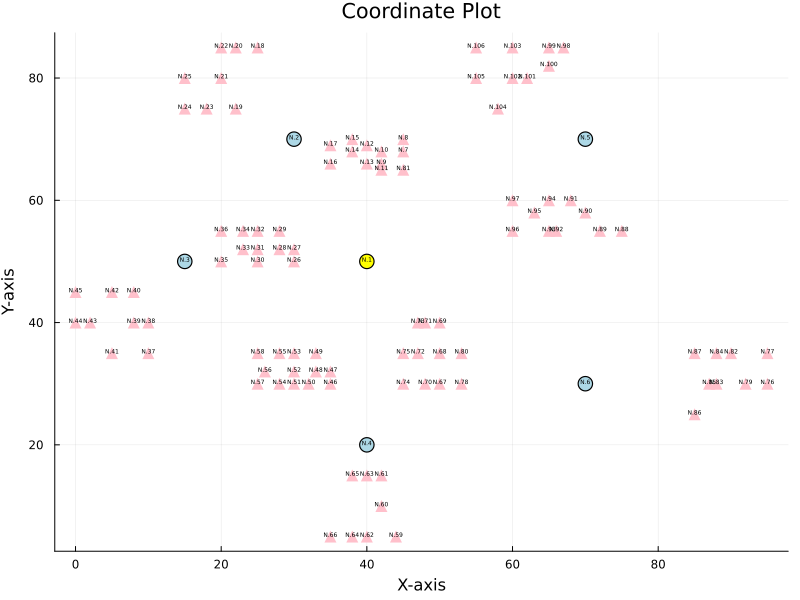

In [5]:
# Disatance matrix
distances = calculate_distance_matrix(x_coor,y_coor,nc)
Vitesse1 = 2
Vitesse2 = 1
println(" ")
TT1 = (distances / Vitesse1)
TT2 = (distances / Vitesse2)

displayMap()
plot!()

In [6]:
#=========================================================================#
model=Model(CPLEX.Optimizer)

# Decision variable
@variable(model, x[A1,A1], Bin)#Arc(x,y) traversed by FEV
@variable(model, y[A1,A1], Bin)#Arc(x,y) traversed by MM
for i in 1:np+1
    @constraint(model, x[i, i] == 0)
    @constraint(model, y[i, i] == 0)
end

@variable(model, t[A2]>=0, Int) #Arrival time

@variable(model, w[P]>=0, Int) #Amount of freight transported from the depot to parking node

@variable(model, z[V2,A2,A2], Bin)#Arc(x,y) traversed by SEV
for m in V2
    for i in A2
        @constraint(model, z[m,i,i] == 0)
        for j in A2
            if i in P && j in P
                @constraint(model, z[m,i,j]==0)
            end
        end
    end
end

@variable(model, f[A2,A2]>=0,Int) #Load of SEV
#=================================================================================================#
@objective(model, Min,
    sum(distances[i, j] * x[i, j] for i in A1, j in A1 if i != j) +
    sum(distances[i, j] * y[i, j] for i in A1, j in A1 if i != j) +
    sum(sum(distances[i, j] * z[r, i, j] for i in A2, j in A2 if i != j) for r in V2))
#=================================================================================================#

#1 #2
#Flow conservation at parking for FEV
@constraint(model, [i in P], sum(x[j,i] for j in A1 if i != j) == sum(x[i,j] for j in A1 if i != j))
@constraint(model, [i in P], sum(x[i,j] for j in A1 if i != j) <= 1)
#3
#Flow conservation of MM
@constraint(model, [i in P], sum(y[i,j] for j in A1 if i != j) + sum(y[j,i] for j in A1 if i != j)<=1)
#4
#Limit for mobile microhub
@constraint(model, [i in A1, j in A1], y[i,j] <= x[i,j])

#5 #6
#Flow conservation at depot
@constraint(model, sum(x[1,j] for j in A1 if j !=1)==1)
@constraint(model, sum(x[j,1] for j in A1 if j !=1)==1)
@constraint(model, [i in A1], y[1,i] ==0)
@constraint(model, [i in A1], y[i,1] ==0)

#7
#Capacity limit for FEV
@constraint(model, sum(w[p] for p in P)<=Q0)

#8
#Can't tow a MM from parking without MM
@constraint(model, [i in P], sum(y[i,j] for j in A1)<= PI[i-1])
#9
#Can't tow a MM to a parking occupied
@constraint(model, [j in P], sum(y[i,j] for i in A1)<=1-PI[j-1])
#10
#If MM leaves a site, the freight to the site should be zero, otw could be positive
@constraint(model, [p in P], w[p]<=Q1*(1-sum(y[p,j] for j in A1)))

#11
#Link 1st and 2nd
@constraint(model, [p in P], w[p] == sum(f[p,j] for j in A2 if p !=j))

#12
#Capacity limit for MM and connection of FEV
@constraint(model, [p in P], w[p] <= Q1*sum(x[i,p] for i in A1))
#13
#Can't distribute from a site without MM
@constraint(model, [p in P], w[p]<=Q1*(sum(y[i,p] for i in A1)+PI[p-1]))

#14
#Flow consercvation at parking and customer for SEV
@constraint(model, [i in A2, r in V2], sum(z[r,i,j] for j in A2) == sum(z[r,j,i] for j in A2))
#15
#Number of vehicles depart from a Parking node
@constraint(model, [p in P], sum(z[r,p,j] for j in A2 for r in V2) <= length(V2))
#16
#Flow conservation at customer node for SEV
@constraint(model, [i in C], sum(z[r,i,j] for j in A2 for r in V2) == 1)
#17
#Each SEV departs from parking node at most once
@constraint(model, [r in V2, p in P], sum(z[r,p,j] for j in A2) <= 1)
#18
#Customer demand met
@constraint(model, [i in C], sum(f[j,i] for j in A2)-sum(f[i,j] for j in A2)==demands[i-1-np])
#19
#Connection and capacity limit for SEV
@constraint(model, [i in A2, j in A2], f[i,j] <= Q2 * sum(z[r,i,j] for r in V2))

#20
@constraint(model, sum(TT1[i,j]*x[i,j] for i in A1 for j in A1) + eta1*sum(PI[p-1]*x[i,p] for p in P for i in A1)<= zeta)

#21
@constraint(model, [i in C, j in P, r in V2], t[i]+TT2[i,j]+eta2 <= zeta + M*(1 - z[r,i,j]))
#22
#Time constraint for FEV and MTZ
@constraint(model, [i in P, j in P], t[i] + eta1*(1-x[i,j]) + TT1[i,j]*x[i,j] <= t[j] + M*(1 - x[i,j]))

#23
#Time constraint for SEV and MTZ
@constraint(model, [i in C, j in C, r in V2], t[i]+eta2*(1-z[r,i,j])+TT2[i,j]*z[r,i,j] <= t[j]+M * (1 - z[r,i,j]))

#24
@constraint(model, [i in C], t[i] >= time_windows[i-1-np][1])
@constraint(model, [i in C], t[i] <= time_windows[i-1-np][2])

#25 26
#Arrival time initialization
@constraint(model, [i in P], TT1[1,i] * x[1,i] <= t[i])
@constraint(model, [p in P, j in C, r in V2], t[p] + TT2[p,j] * z[r,p,j] <= t[j])

3-dimensional DenseAxisArray{ConstraintRef{Model, MathOptInterface.ConstraintIndex{MathOptInterface.ScalarAffineFunction{Float64}, MathOptInterface.LessThan{Float64}}, ScalarShape},3,...} with index sets:
    Dimension 1, 2:6
    Dimension 2, 7:106
    Dimension 3, 1:10
And data, a 5×100×10 Array{ConstraintRef{Model, MathOptInterface.ConstraintIndex{MathOptInterface.ScalarAffineFunction{Float64}, MathOptInterface.LessThan{Float64}}, ScalarShape}, 3}:
[:, :, 1] =
 t[2] - t[7] + 15.132745950421556 z[1,2,7] ≤ 0  …  t[2] - t[106] + 29.154759474226502 z[1,2,106] ≤ 0
 t[3] - t[7] + 34.9857113690718 z[1,3,7] ≤ 0       t[3] - t[106] + 53.150729063673246 z[1,3,106] ≤ 0
 t[4] - t[7] + 48.25971404805462 z[1,4,7] ≤ 0      t[4] - t[106] + 66.70832032063167 z[1,4,106] ≤ 0
 t[5] - t[7] + 25.079872407968907 z[1,5,7] ≤ 0     t[5] - t[106] + 21.213203435596427 z[1,5,106] ≤ 0
 t[6] - t[7] + 45.48626166217664 z[1,6,7] ≤ 0      t[6] - t[106] + 57.0087712549569 z[1,6,106] ≤ 0

[:, :, 2] =
 t[2] - t[7] + 15.

In [7]:
set_optimizer_attribute(model, "CPX_PARAM_TILIM", 3600)
# Solve the model
optimize!(model)

# Check the solver status
status = termination_status(model)
println("Solver status: ", status)

# Get the solution if it exists
if status == MOI.OPTIMAL || status == MOI.TIME_LIMIT
    println("Total distance traveled: ", objective_value(model))
else
    println("No feasible solution found.")
end

Version identifier: 22.1.1.0 | 2022-11-28 | 9160aff4d
CPXPARAM_TimeLimit                               3600
Tried aggregator 1 time.
MIP Presolve eliminated 104166 rows and 53722 columns.
MIP Presolve modified 35298 coefficients.
Reduced MIP has 19803 rows, 67735 columns, and 300860 nonzeros.
Reduced MIP has 61480 binaries, 6255 generals, 0 SOSs, and 0 indicators.
Presolve time = 0.15 sec. (310.97 ticks)
Probing fixed 0 vars, tightened 5645 bounds.
Probing time = 0.85 sec. (783.17 ticks)
Cover probing fixed 0 vars, tightened 1 bounds.
Tried aggregator 1 time.
Detecting symmetries...
MIP Presolve modified 200 coefficients.
Reduced MIP has 19803 rows, 67735 columns, and 300860 nonzeros.
Reduced MIP has 61480 binaries, 6255 generals, 0 SOSs, and 0 indicators.
Presolve time = 0.11 sec. (206.00 ticks)
Probing time = 0.08 sec. (27.70 ticks)
Cover probing fixed 0 vars, tightened 326 bounds.
Clique table members: 187630.
MIP emphasis: balance optimality and feasibility.
MIP search method: dyna

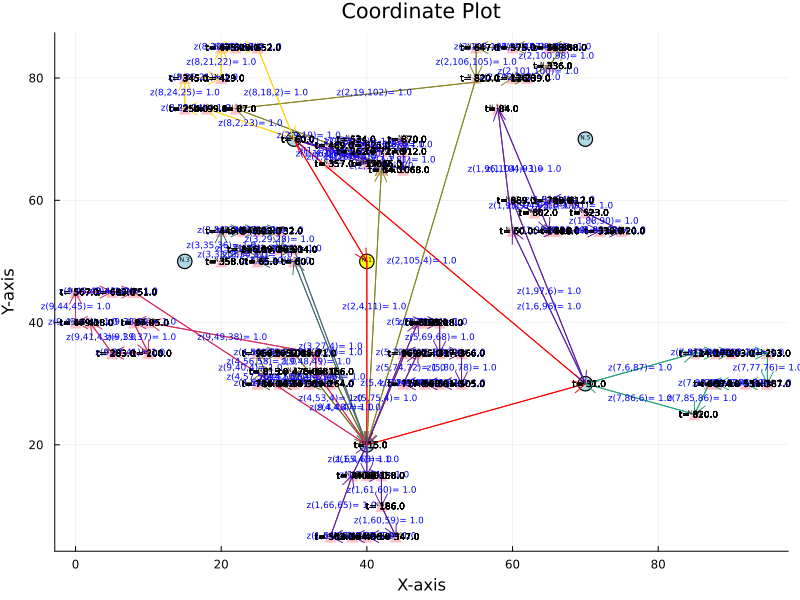

In [8]:
displayMap()

time_labels = [string("t= ", round(value(t[i]))) for i in A2]
SEV_labels = [string("z(",r,",",i,",",j,")= ", round(value(z[r,i,j]))) for r in V2 for i in A2 for j in A2]
light_green = RGBA(0.5, 1.0, 0.5, 1.0)
color_list = generate_rgb_colors(length(V2))
# Add FEV arcs between the locations if they are traversed
for i in A1
    for j in A1         
        if round(value(y[i, j])) == 1
            plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], 
                  line=:arrow,color = light_green, label = "", linealpha=4, lw=4)
        end
        if round(value(x[i, j])) == 1
            plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], 
                  line=:arrow,color = :red, label = "")
        end
    end
end

# Add SEV arcs between the locations if they are traverse
for r in V2
    for i in A2
        if value(t[i])!=0 annotate!(x_coor[i]+0.5, y_coor[i], text(time_labels[i-1], :center, 6)) end
        for j in A2
            if round(value(z[r, i, j])) == 1
                plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], line=:arrow, color = color_list[r] )
                mid_x = (x_coor[i] + x_coor[j]) / 2 
                mid_y = (y_coor[i] + y_coor[j]) / 2 + 0.2
                annotate!(mid_x, mid_y, text(SEV_labels[(r-1)*(np+nc)*(np+nc)+(i-2)*(np+nc)+j-1],6 ,:blue))
                if value(f[i,j]) != 0
                    mid_x = (x_coor[i] + x_coor[j]) / 2
                    mid_y = (y_coor[i] + y_coor[j]) / 2 - 0.2
                end
            end
        end
    end
end

plot!()

In [9]:
for i in A1
    for j in A1 if round(value(x[i,j]))==1 print("  x[",i,",",j,"]=",round(value(x[i,j]))) end end
end
println(" ")
for i in A1
    for j in A1 if value(y[i,j])==1 print("  y[",i,",",j,"]=",value(y[i,j])) end end
end
println(" ")
for i in A2 print("  t[",i,"]=",value(t[i])) end
println(" ")
for r in V2
    for i in A2
        for j in A2 if round(value(z[r,i,j]))==1 print("  z[",r,",",i,",",j,"]=",round(value(z[r,i,j]))) end end
    end
    println("") 
    println("")
end
println(" ")
for i in P
    print("  w[",i,"]=",value(w[i]))
end
println(" ")
for i in A2
    for j in A2 if value(f[i,j]) != 0 print("  f[",i,",",j,"]=",value(f[i,j])) end end
end

  x[1,4]=1.0  x[2,1]=1.0  x[4,6]=1.0  x[6,2]=1.0 
 
  t[2]=60.0  t[3]=0.0  t[4]=15.0  t[5]=0.0  t[6]=31.0  t[7]=911.9999999999935  t[8]=870.0  t[9]=65.0  t[10]=727.0  t[11]=64.0  t[12]=625.0  t[13]=170.0  t[14]=262.0  t[15]=534.0  t[16]=357.0  t[17]=489.0  t[18]=652.0  t[19]=87.0  t[20]=620.0  t[21]=429.0  t[22]=475.0  t[23]=99.0  t[24]=254.0  t[25]=345.0  t[26]=60.0  t[27]=914.0  t[28]=883.0  t[29]=732.0  t[30]=65.0  t[31]=169.0  t[32]=622.0  t[33]=316.0  t[34]=546.0  t[35]=358.00000000024033  t[36]=449.0  t[37]=200.0  t[38]=95.0  t[39]=97.0  t[40]=751.0  t[41]=283.0  t[42]=683.0  t[43]=418.0  t[44]=479.0  t[45]=567.0  t[46]=264.0  t[47]=166.0  t[48]=68.0  t[49]=71.0  t[50]=359.0  t[51]=541.0  t[52]=475.0  t[53]=1068.0  t[54]=632.0  t[55]=1052.0  t[56]=815.0  t[57]=786.0  t[58]=969.0  t[59]=347.0  t[60]=186.0  t[61]=158.0  t[62]=436.0  t[63]=60.0  t[64]=534.0  t[65]=740.0  t[66]=562.0  t[67]=531.0  t[68]=317.0  t[69]=218.0  t[70]=688.0  t[71]=129.0  t[72]=875.0  t[73]=60.0  t[74]=777.

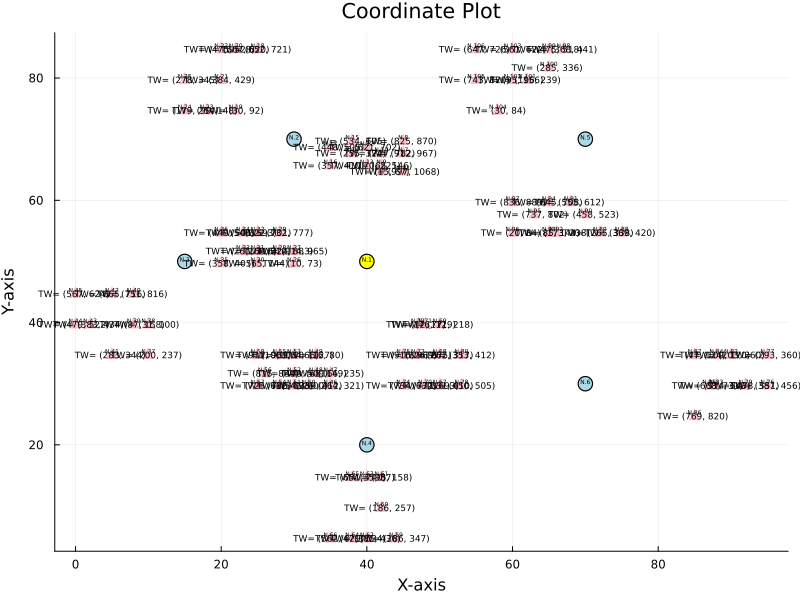

In [10]:
displayMap()
speed1_labels = [string("TT1(",i,",",j,")= ", round(value(TT1[i,j]), digits=2)) for i in N for j in N]
speed2_labels = [string("TT2(",i,",",j,")= ", round(value(TT2[i,j]), digits=2)) for i in N for j in N]
demand_labels = [string("TW= ",time_windows[i-1-np]) for i in C]

for i in C
    annotate!(x_coor[i]-0.3, y_coor[i]-0.3, text(demand_labels[i-1-np], :center, 6)) 
end 

if termination_status(model) == MOI.OPTIMAL
    time_labels = [string("t= ", round(value(t[i]))) for i in A2]
    SEV_labels = [string("z(",r,",",i,",",j,")= ", round(value(z[r,i,j]))) for r in V2 for i in A2 for j in A2]
    light_green = RGBA(0.5, 1.0, 0.5, 1.0)
    color_list = generate_rgb_colors(length(V2))
    # Add FEV arcs between the locations if they are traversed
    for i in A1
        for j in A1         
            if round(value(y[i, j])) == 1
                plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], 
                      line=:arrow,color = light_green, label = "", linealpha=4, lw=4)
            end
            if round(value(x[i, j])) == 1
                plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], 
                      line=:arrow,color = :red, label = "")
                mid_x = (x_coor[i] + x_coor[j]) / 2
                mid_y = (y_coor[i] + y_coor[j]) / 2 +0.2
                annotate!(mid_x, mid_y, text(speed1_labels[(i-1)*(np+nc+1)+j],6 ,:blue))
            end
        end
    end
    
    # Add SEV arcs between the locations if they are traverse
    for r in V2
        for i in A2
            annotate!(x_coor[i]+0.5, y_coor[i], text(time_labels[i-1], :center, 6))
            for j in A2
                if round(value(z[r, i, j])) == 1
                    plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], line=:arrow, color = color_list[r] )
                    mid_x = (x_coor[i] + x_coor[j]) / 2 
                    mid_y = (y_coor[i] + y_coor[j]) / 2 + 0.2
                    # annotate!(mid_x, mid_y, text(SEV_labels[(r-1)*(np+nc)*(np+nc)+(i-2)*(np+nc)+j-1],6 ,:blue))
                    annotate!(mid_x, mid_y, text(speed2_labels[(i-1)*(np+nc+1)+j],6 ,:blue))
                end
            end
        end
    end
end
plot!()

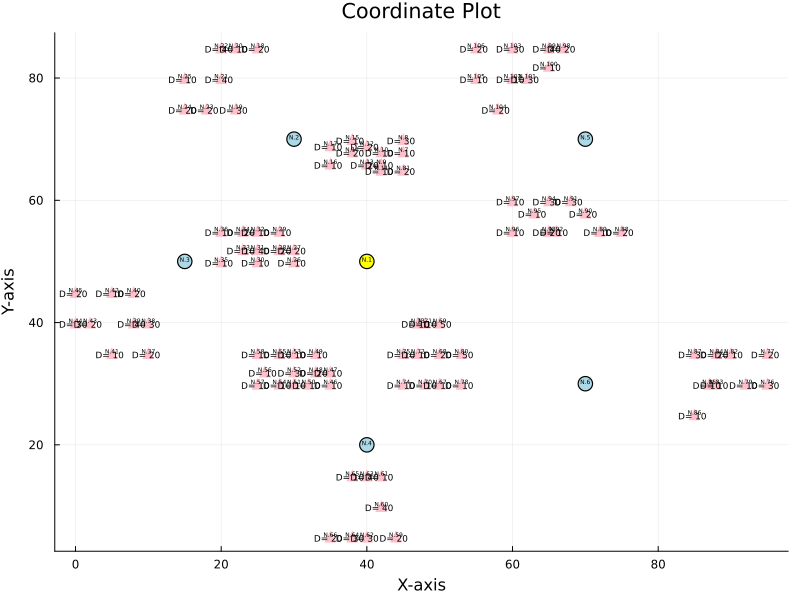

In [11]:
displayMap()
demand_labels = [string("D= ", demands[i-1-np]) for i in C]
for i in C
    annotate!(x_coor[i]-0.3, y_coor[i]-0.3, text(demand_labels[i-1-np], :center, 6)) 
end 


if termination_status(model) == MOI.OPTIMAL
    time_labels = [string("t= ", value(t[i])) for i in A2]
    flow_labels = [string("f(",i,",",j,")= ", floor(value(f[i,j]))) for i in A2 for j in A2]
    loan_labels = [string("w= ", floor(value(w[i]))) for i in P]
    light_green = RGBA(0.5, 1.0, 0.5, 1.0)
    color_list = generate_rgb_colors(length(V2))
    # Add FEV arcs between the locations if they are traversed
    for i in A1
        for j in A1         
            if round(value(y[i, j])) == 1
                plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], 
                      line=:arrow,color = light_green, label = "", linealpha=4, lw=4)
            end
            if round(value(x[i, j])) == 1
                plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], 
                      line=:arrow,color = :red, label = "")
            end
        end
    end
    
    # Add SEV arcs between the locations if they are traverse
    for r in V2
        for i in A2
#             annotate!(x_coor[i]+0.5, y_coor[i], text(time_labels[i-1], :center, 6))
            for j in A2
                if round(value(z[r, i, j])) == 1
                    plot!([x_coor[i], x_coor[j]], [y_coor[i], y_coor[j]], line=:arrow, color = color_list[r] )
                    mid_x = (x_coor[i] + x_coor[j]) / 2
                    mid_y = (y_coor[i] + y_coor[j]) / 2 + 0.2
#                     annotate!(mid_x, mid_y, text(SEV_labels[(r-1)*(np+nc)*(np+nc)+(i-2)*(np+nc)+j-1],6 ,:blue))
                    
                end
                if value(f[i,j]) != 0
                    mid_x = (x_coor[i] + x_coor[j]) / 2
                    mid_y = (y_coor[i] + y_coor[j]) / 2 - 0.2
                    annotate!(mid_x, mid_y, text(flow_labels[(i-2)*(np+nc)+j-1],6 ,:blue))
                end
            end
        end
    end
    
    for p in P
        annotate!(x_coor[p]+0.2,y_coor[p]-0.2, text(loan_labels[p-1],6 ,:blue))
    end
end
plot!()